🚀 COMPREHENSIVE KEYWORD NETWORK ANALYSIS
✅ Found data file: co_occurrence_matrix.csv
📊 Loaded dataset: (276, 276)
🧹 Cleaned data: (276, 276)
🔨 Building network (min_weight=1)...
✅ Network built: 276 nodes, 5115 edges

📊 NETWORK ANALYSIS RESULTS
Total Keywords (Nodes): 276
Total Connections (Edges): 5115
Network Density: 0.1348
Average Degree: 37.07
Connected Components: 1

🔍 Calculating importance metrics...

🏆 TOP 10 MOST IMPORTANT KEYWORDS:
 1. Management                (Score: 0.0646)
 2. Organizational            (Score: 0.0569)
 3. Behavior                  (Score: 0.0229)
 4. Business                  (Score: 0.0207)
 5. Industrial                (Score: 0.0195)
 6. Relations                 (Score: 0.0153)
 7. Psychology                (Score: 0.0146)
 8. Decision                  (Score: 0.0143)
 9. Making                    (Score: 0.0135)
10. Personnel                 (Score: 0.0135)

🎨 Creating comprehensive visualizations...

1️⃣ COMMUNITY STRUCTURE OVERVIEW
🎨 Creating Comm

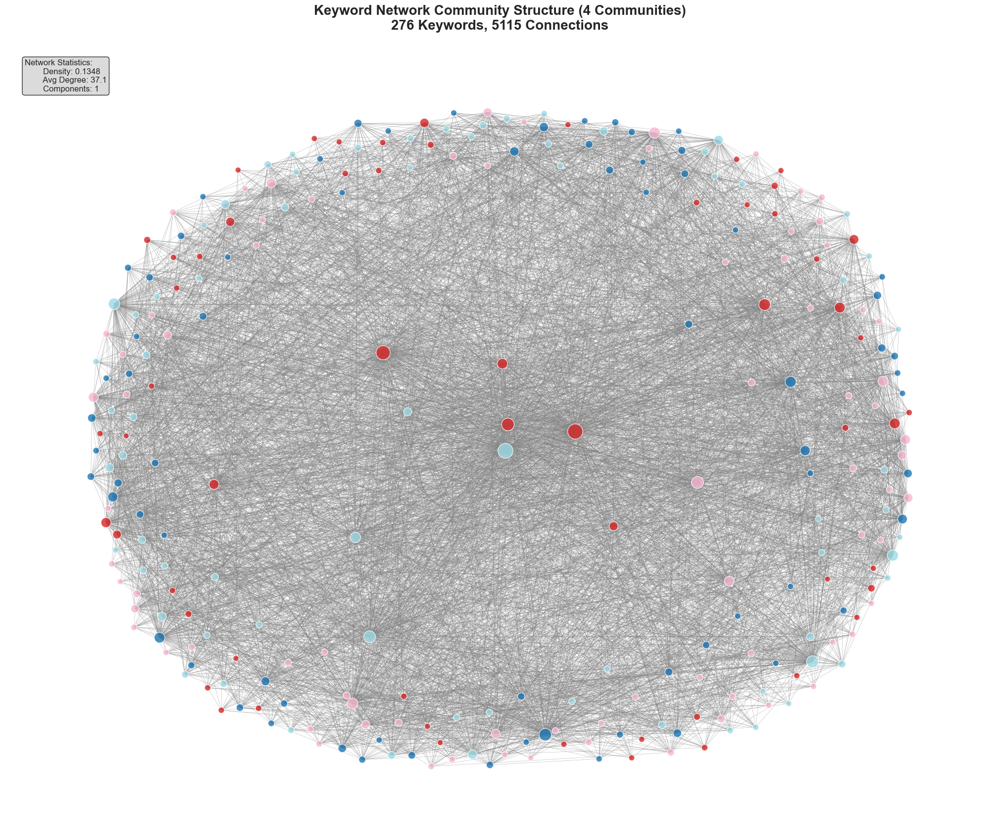


2️⃣ KEYWORD IMPORTANCE ANALYSIS
🎨 Creating Importance Analysis...


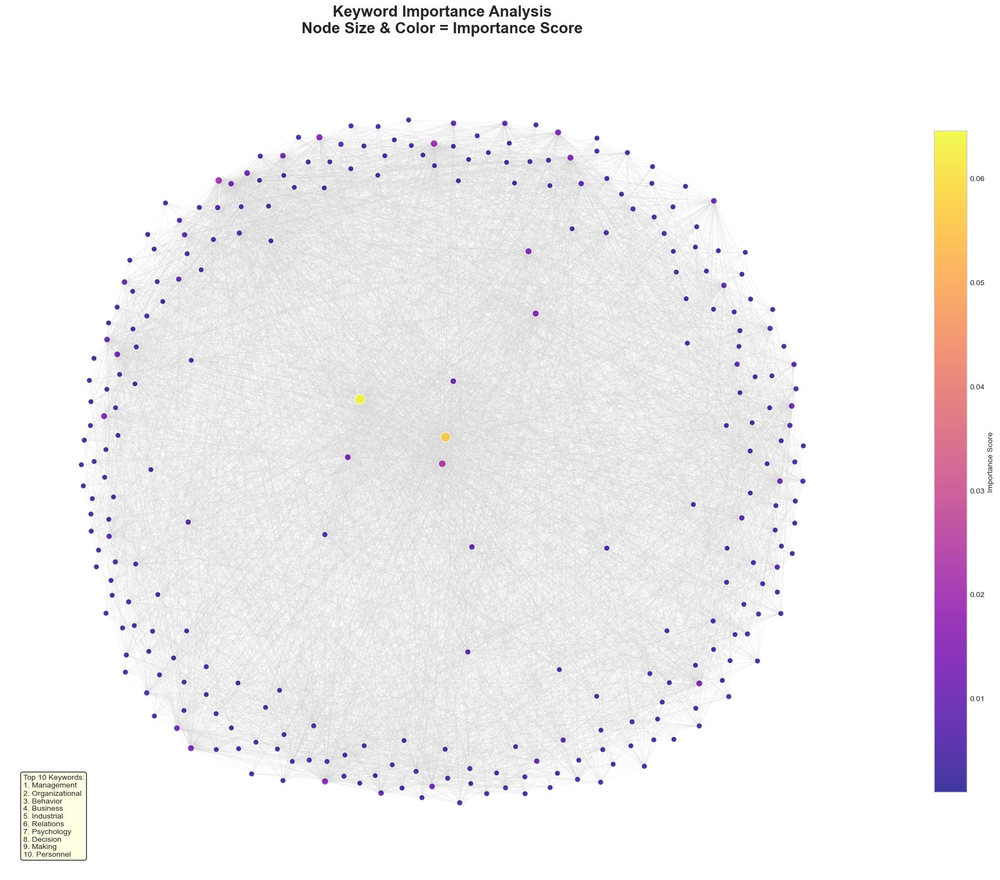


3️⃣ HUB KEYWORDS ANALYSIS
🎨 Creating Hub Analysis (Top 25 Keywords)...


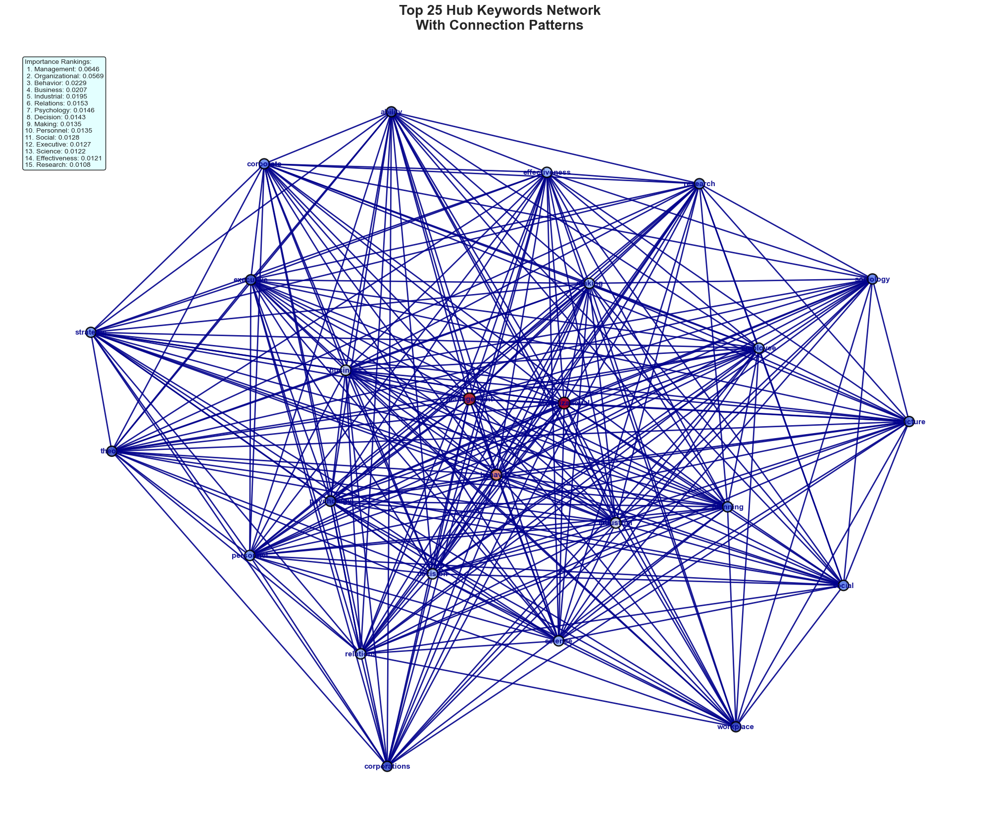


4️⃣ STRONGEST CONNECTIONS NETWORK
🎨 Creating Strongest Connections (Top 25%)...
   Showing 1952 strongest connections out of 5115 total


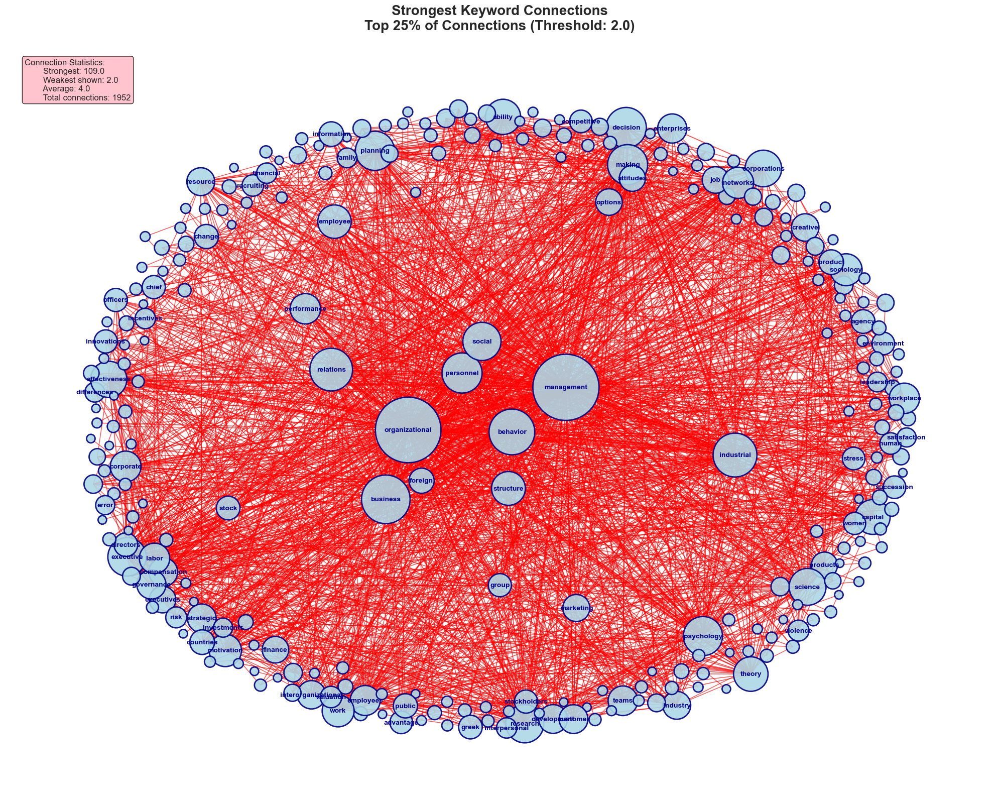


✅ ANALYSIS COMPLETE!
Generated 4 comprehensive network visualizations
Network contains 276 keywords with 5115 connections

📊 ANALYSIS SUMMARY
✅ Data successfully loaded and analyzed
✅ Network structure revealed
✅ Key insights identified
✅ Visualizations generated

Refer to the generated plots for detailed insights into
keyword relationships, community structures, and importance rankings.


In [1]:
"""
Professional Network Analysis: Keyword Co-occurrence Study
=========================================================

Author: Rosalina Torres
Title: "The Science Behind the Art"

This module provides comprehensive network analysis tools for examining keyword 
co-occurrence patterns in large datasets. It generates multiple visualization 
perspectives to reveal community structures, importance rankings, and connection patterns.

Dependencies:
- pandas, networkx, matplotlib, numpy, seaborn
- Optional: python-louvain (for community detection)
"""

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import warnings
import time

# Configuration
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

class NetworkAnalyzer:
    """
    A comprehensive network analysis toolkit for keyword co-occurrence data.
    
    This class handles data loading, network construction, and generates multiple
    analytical visualizations to understand keyword relationships and importance.
    """
    
    def __init__(self, data_path=None):
        """
        Initialize the NetworkAnalyzer.
        
        Args:
            data_path (str, optional): Path to co-occurrence matrix CSV file
        """
        self.data_path = data_path
        self.co_occurrence_matrix = None
        self.network = None
        self.logger = None
        
    def find_data_file(self):
        """
        Locate the co-occurrence matrix file from common paths.
        
        Returns:
            str or None: Path to the data file if found, None otherwise
        """
        if self.data_path and os.path.exists(self.data_path):
            return self.data_path
            
        common_paths = [
            "co_occurrence_matrix.csv",
            os.path.expanduser("~/Downloads/co_occurrence_matrix.csv"),
            os.path.expanduser("~/Desktop/co_occurrence_matrix.csv")
        ]
        
        for path in common_paths:
            if os.path.exists(path):
                print(f"✅ Found data file: {path}")
                return path
                
        print("⚠️ No data file found in common locations")
        return None
    
    def load_data(self):
        """
        Load and clean the co-occurrence matrix data.
        
        Returns:
            bool: True if data loaded successfully, False otherwise
        """
        file_path = self.find_data_file()
        
        if not file_path:
            print("❌ Cannot proceed without data file")
            return False
            
        try:
            self.co_occurrence_matrix = pd.read_csv(file_path, index_col=0)
            print(f"📊 Loaded dataset: {self.co_occurrence_matrix.shape}")
            
            # Clean keyword names
            self.co_occurrence_matrix.columns = self.co_occurrence_matrix.columns.map(self._clean_keyword)
            self.co_occurrence_matrix.index = self.co_occurrence_matrix.index.map(self._clean_keyword)
            
            # Remove empty keywords
            self.co_occurrence_matrix = self.co_occurrence_matrix.loc[
                self.co_occurrence_matrix.index != '', 
                self.co_occurrence_matrix.columns != ''
            ]
            
            print(f"🧹 Cleaned data: {self.co_occurrence_matrix.shape}")
            return True
            
        except Exception as e:
            print(f"❌ Error loading data: {e}")
            return False
    
    def _clean_keyword(self, keyword):
        """Clean and standardize keyword strings."""
        if pd.isna(keyword):
            return ""
        cleaned = " ".join(str(keyword).replace("--", " ").split())
        return cleaned.strip().lower()
    
    def build_network(self, min_weight=1):
        """
        Build a weighted network from the co-occurrence matrix.
        
        Args:
            min_weight (int): Minimum edge weight to include in network
            
        Returns:
            bool: True if network built successfully, False otherwise
        """
        if self.co_occurrence_matrix is None:
            print("❌ No data loaded. Call load_data() first.")
            return False
            
        print(f"🔨 Building network (min_weight={min_weight})...")
        
        self.network = nx.Graph()
        
        # Add edges based on co-occurrence weights
        for word1 in self.co_occurrence_matrix.index:
            for word2 in self.co_occurrence_matrix.columns:
                if word1 != word2:
                    weight = self.co_occurrence_matrix.at[word1, word2]
                    if pd.notna(weight) and weight >= min_weight:
                        self.network.add_edge(word1, word2, weight=weight)
        
        # Remove isolated nodes
        isolated_nodes = list(nx.isolates(self.network))
        self.network.remove_nodes_from(isolated_nodes)
        
        print(f"✅ Network built: {self.network.number_of_nodes()} nodes, {self.network.number_of_edges()} edges")
        return True
    
    def analyze_network_properties(self):
        """
        Calculate and display key network properties.
        
        Returns:
            dict: Dictionary containing network metrics
        """
        if self.network is None:
            print("❌ No network available. Build network first.")
            return {}
            
        print("\n📊 NETWORK ANALYSIS RESULTS")
        print("=" * 50)
        
        metrics = {
            'nodes': self.network.number_of_nodes(),
            'edges': self.network.number_of_edges(),
            'density': nx.density(self.network),
            'avg_degree': sum(dict(self.network.degree()).values()) / self.network.number_of_nodes(),
            'components': nx.number_connected_components(self.network)
        }
        
        print(f"Total Keywords (Nodes): {metrics['nodes']}")
        print(f"Total Connections (Edges): {metrics['edges']}")
        print(f"Network Density: {metrics['density']:.4f}")
        print(f"Average Degree: {metrics['avg_degree']:.2f}")
        print(f"Connected Components: {metrics['components']}")
        
        # Calculate centrality measures
        try:
            print("\n🔍 Calculating importance metrics...")
            degree_centrality = nx.degree_centrality(self.network)
            pagerank = nx.pagerank(self.network, weight='weight', max_iter=100)
            
            # Top 10 most important keywords
            top_keywords = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
            print("\n🏆 TOP 10 MOST IMPORTANT KEYWORDS:")
            for i, (keyword, score) in enumerate(top_keywords, 1):
                print(f"{i:2d}. {keyword.title():<25} (Score: {score:.4f})")
                
            metrics['top_keywords'] = top_keywords
            
        except Exception as e:
            print(f"⚠️ Error calculating centrality: {e}")
            
        return metrics
    
    def create_community_overview(self, figsize=(20, 16)):
        """Create community structure visualization."""
        if self.network is None:
            return
            
        print("🎨 Creating Community Structure Overview...")
        
        degree_centrality = nx.degree_centrality(self.network)
        
        # Try community detection
        try:
            import community as community_louvain
            communities = community_louvain.best_partition(self.network, weight='weight')
            node_colors = [communities[node] for node in self.network.nodes()]
            cmap = plt.cm.tab20
            title_extra = f" ({len(set(communities.values()))} Communities)"
        except ImportError:
            node_colors = [degree_centrality[node] for node in self.network.nodes()]
            cmap = plt.cm.viridis
            title_extra = " (Degree-based Coloring)"
        
        pos = nx.spring_layout(self.network, k=3, iterations=30, weight='weight')
        node_sizes = [50 + degree_centrality[node] * 500 for node in self.network.nodes()]
        
        plt.figure(figsize=figsize, facecolor='white')
        nx.draw(self.network, pos, node_size=node_sizes, node_color=node_colors,
               cmap=cmap, alpha=0.8, linewidths=1, edgecolors='white',
               edge_color='gray', width=0.3)
        
        plt.title(f'Keyword Network Community Structure{title_extra}\n'
                 f'{self.network.number_of_nodes()} Keywords, {self.network.number_of_edges()} Connections', 
                 fontsize=20, fontweight='bold', pad=20)
        
        # Add network statistics
        stats_text = f"""Network Statistics:
        Density: {nx.density(self.network):.4f}
        Avg Degree: {sum(dict(self.network.degree()).values()) / self.network.number_of_nodes():.1f}
        Components: {nx.number_connected_components(self.network)}"""
        
        plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes, 
                fontsize=12, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))
        
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    def create_importance_analysis(self, figsize=(20, 16)):
        """Create PageRank importance visualization."""
        if self.network is None:
            return
            
        print("🎨 Creating Importance Analysis...")
        
        try:
            pagerank = nx.pagerank(self.network, weight='weight', max_iter=100)
        except:
            pagerank = {node: 1/self.network.number_of_nodes() for node in self.network.nodes()}
        
        pos = nx.spring_layout(self.network, k=3, iterations=30, weight='weight')
        node_sizes = [50 + pagerank[node] * 2000 for node in self.network.nodes()]
        node_colors = [pagerank[node] for node in self.network.nodes()]
        
        plt.figure(figsize=figsize, facecolor='white')
        
        # Draw edges
        nx.draw_networkx_edges(self.network, pos, edge_color='lightgray', width=0.3, alpha=0.5)
        
        # Draw nodes with colorbar
        nodes = nx.draw_networkx_nodes(self.network, pos, node_size=node_sizes, 
                                      node_color=node_colors, cmap=plt.cm.plasma, 
                                      alpha=0.8, linewidths=1, edgecolors='white')
        
        plt.colorbar(nodes, label='Importance Score', shrink=0.8)
        plt.title('Keyword Importance Analysis\nNode Size & Color = Importance Score', 
                 fontsize=20, fontweight='bold', pad=20)
        
        # Show top keywords
        top_keywords = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
        top_text = "Top 10 Keywords:\n" + "\n".join([
            f"{i+1}. {node.title()}" for i, (node, _) in enumerate(top_keywords)
        ])
        
        plt.text(0.02, 0.02, top_text, transform=plt.gca().transAxes, 
                fontsize=10, verticalalignment='bottom',
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
        
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    def create_hub_analysis(self, figsize=(20, 16), top_n=25):
        """Create hub keywords visualization with labels."""
        if self.network is None:
            return
            
        print(f"🎨 Creating Hub Analysis (Top {top_n} Keywords)...")
        
        try:
            pagerank = nx.pagerank(self.network, weight='weight', max_iter=100)
            degree_centrality = nx.degree_centrality(self.network)
        except:
            pagerank = {node: 1 for node in self.network.nodes()}
            degree_centrality = {node: 1 for node in self.network.nodes()}
        
        # Get top N most important nodes
        top_nodes = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:top_n]
        hub_network = self.network.subgraph([node for node, _ in top_nodes]).copy()
        
        if len(hub_network.nodes()) == 0:
            print("❌ No hub nodes found")
            return
        
        pos = nx.spring_layout(hub_network, k=5, iterations=50, weight='weight')
        node_sizes = [200 + pagerank[node] * 1500 for node in hub_network.nodes()]
        node_colors = [degree_centrality[node] for node in hub_network.nodes()]
        
        plt.figure(figsize=figsize, facecolor='white')
        nx.draw(hub_network, pos, node_size=node_sizes, node_color=node_colors,
               cmap=plt.cm.coolwarm, alpha=0.9, linewidths=2, edgecolors='black',
               edge_color='darkblue', width=2, with_labels=True, 
               font_size=11, font_weight='bold', font_color='darkblue')
        
        plt.title(f'Top {top_n} Hub Keywords Network\nWith Connection Patterns', 
                 fontsize=20, fontweight='bold', pad=20)
        
        # Add ranking list
        ranking_text = f"Importance Rankings:\n" + "\n".join([
            f"{i+1:2d}. {node.title()}: {score:.4f}" 
            for i, (node, score) in enumerate(top_nodes[:15])
        ])
        
        plt.text(0.02, 0.98, ranking_text, transform=plt.gca().transAxes, 
                fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.9))
        
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    def create_strong_connections(self, figsize=(20, 16), percentile=75):
        """Create strongest connections visualization."""
        if self.network is None:
            return
            
        print(f"🎨 Creating Strongest Connections (Top {100-percentile}%)...")
        
        edges = list(self.network.edges(data=True))
        if len(edges) == 0:
            print("❌ No edges found")
            return
        
        weights = [d['weight'] for u, v, d in edges]
        threshold = np.percentile(weights, percentile)
        
        strong_edges = [(u, v) for u, v, d in edges if d['weight'] >= threshold]
        strong_network = self.network.edge_subgraph(strong_edges).copy()
        
        if len(strong_network.nodes()) == 0:
            print("❌ No strong connections found")
            return
        
        print(f"   Showing {len(strong_network.edges())} strongest connections out of {len(edges)} total")
        
        pos = nx.spring_layout(strong_network, k=4, iterations=50, weight='weight')
        
        plt.figure(figsize=figsize, facecolor='white')
        
        # Calculate edge widths and node sizes
        edge_weights = [strong_network[u][v]['weight'] for u, v in strong_network.edges()]
        max_weight, min_weight = max(edge_weights), min(edge_weights)
        edge_widths = [(w - min_weight) / (max_weight - min_weight) * 8 + 1 for w in edge_weights]
        
        node_degrees = dict(strong_network.degree())
        node_sizes = [100 + node_degrees[node] * 50 for node in strong_network.nodes()]
        
        # Draw network
        nx.draw_networkx_edges(strong_network, pos, width=edge_widths, 
                              edge_color='red', alpha=0.7)
        nx.draw_networkx_nodes(strong_network, pos, node_size=node_sizes, 
                              node_color='lightblue', alpha=0.9, 
                              linewidths=2, edgecolors='navy')
        
        # Label high-degree nodes
        high_degree_nodes = {
            node: node for node in strong_network.nodes() 
            if node_degrees[node] >= np.percentile(list(node_degrees.values()), 70)
        }
        
        if high_degree_nodes:
            nx.draw_networkx_labels(strong_network, pos, labels=high_degree_nodes,
                                   font_size=10, font_weight='bold', font_color='darkblue')
        
        plt.title(f'Strongest Keyword Connections\nTop {100-percentile}% of Connections (Threshold: {threshold:.1f})', 
                 fontsize=20, fontweight='bold', pad=20)
        
        # Add statistics
        stats_text = f"""Connection Statistics:
        Strongest: {max_weight:.1f}
        Weakest shown: {min_weight:.1f}
        Average: {np.mean(edge_weights):.1f}
        Total connections: {len(strong_network.edges())}"""
        
        plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes, 
                fontsize=12, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='lightpink', alpha=0.8))
        
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    def run_complete_analysis(self):
        """
        Execute complete network analysis pipeline.
        
        This method runs the full analysis including data loading, network construction,
        and generation of all four visualization perspectives.
        """
        print("🚀 COMPREHENSIVE KEYWORD NETWORK ANALYSIS")
        print("=" * 60)
        
        # Load and prepare data
        if not self.load_data():
            return False
        
        # Build network
        if not self.build_network():
            return False
        
        # Analyze network properties
        metrics = self.analyze_network_properties()
        
        # Generate visualizations
        print(f"\n🎨 Creating comprehensive visualizations...")
        print("=" * 50)
        
        print("\n1️⃣ COMMUNITY STRUCTURE OVERVIEW")
        self.create_community_overview()
        
        print("\n2️⃣ KEYWORD IMPORTANCE ANALYSIS") 
        self.create_importance_analysis()
        
        print("\n3️⃣ HUB KEYWORDS ANALYSIS")
        self.create_hub_analysis()
        
        print("\n4️⃣ STRONGEST CONNECTIONS NETWORK")
        self.create_strong_connections()
        
        print(f"\n✅ ANALYSIS COMPLETE!")
        print(f"Generated 4 comprehensive network visualizations")
        print(f"Network contains {metrics.get('nodes', 0)} keywords with {metrics.get('edges', 0)} connections")
        
        return True


def main():
    """
    Main execution function for keyword network analysis.
    
    Usage:
        analyzer = NetworkAnalyzer('path/to/co_occurrence_matrix.csv')
        analyzer.run_complete_analysis()
    """
    # Initialize analyzer
    analyzer = NetworkAnalyzer()
    
    # Run complete analysis
    success = analyzer.run_complete_analysis()
    
    if success:
        print("\n📊 ANALYSIS SUMMARY")
        print("=" * 30)
        print("✅ Data successfully loaded and analyzed")
        print("✅ Network structure revealed")
        print("✅ Key insights identified")
        print("✅ Visualizations generated")
        print("\nRefer to the generated plots for detailed insights into")
        print("keyword relationships, community structures, and importance rankings.")
    else:
        print("\n❌ Analysis failed. Please check your data file and try again.")


if __name__ == "__main__":
    main()

In [4]:
pip install pandas networkx matplotlib numpy seaborn

Note: you may need to restart the kernel to use updated packages.


In [5]:
# Add this to your analyzer to find potential gaps:

def find_bridge_concepts(self):
    """Find concepts that, if removed, would most disconnect the network"""
    betweenness = nx.betweenness_centrality(self.network)
    bridges = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:10]
    
    print("🌉 TOP BRIDGE CONCEPTS (potential gap areas):")
    for concept, score in bridges:
        print(f"- {concept}: {score:.4f}")

def find_weak_connections(self):
    """Find concept pairs that should be stronger"""
    # Look for important nodes with surprisingly weak connections
    pagerank = nx.pagerank(self.network)
    
    for node in list(pagerank.keys())[:20]:  # Top 20 by importance
        connections = list(self.network.neighbors(node))
        weak_links = [c for c in connections 
                     if self.network[node][c]['weight'] < 5]  # Adjust threshold
        if weak_links:
            print(f"\n{node} has weak links to: {weak_links}")

🚀 COMPLETE NETWORK ANALYSIS WITH DEEP INSIGHTS
✅ Found data file: co_occurrence_matrix.csv
📊 Loaded dataset: (276, 276)
🧹 Cleaned data: (276, 276)
🔨 Building network (min_weight=1)...
✅ Network built: 276 nodes, 5115 edges

📊 NETWORK OVERVIEW:
  Nodes: 276
  Edges: 5115
  Density: 0.1348

🎯 DECISION-MAKING CONCEPTS ANALYSIS

Found 4 decision-related concepts:
  - decision
  - judgment
  - making
  - selection

📊 Decision Concept Metrics:
Concept              PageRank   Degree     Connections 
----------------------------------------------------
decision             0.0143     0.5091     140         
judgment             0.0014     0.0727     20          
making               0.0135     0.4909     135         
selection            0.0017     0.0836     23          

🔗 Top Connections to Decision Concepts:

decision strongly connects to:
  - management (weight: 31)
  - making (weight: 20)
  - organizational (weight: 20)
  - behavior (weight: 9)
  - business (weight: 9)

judgment strongly

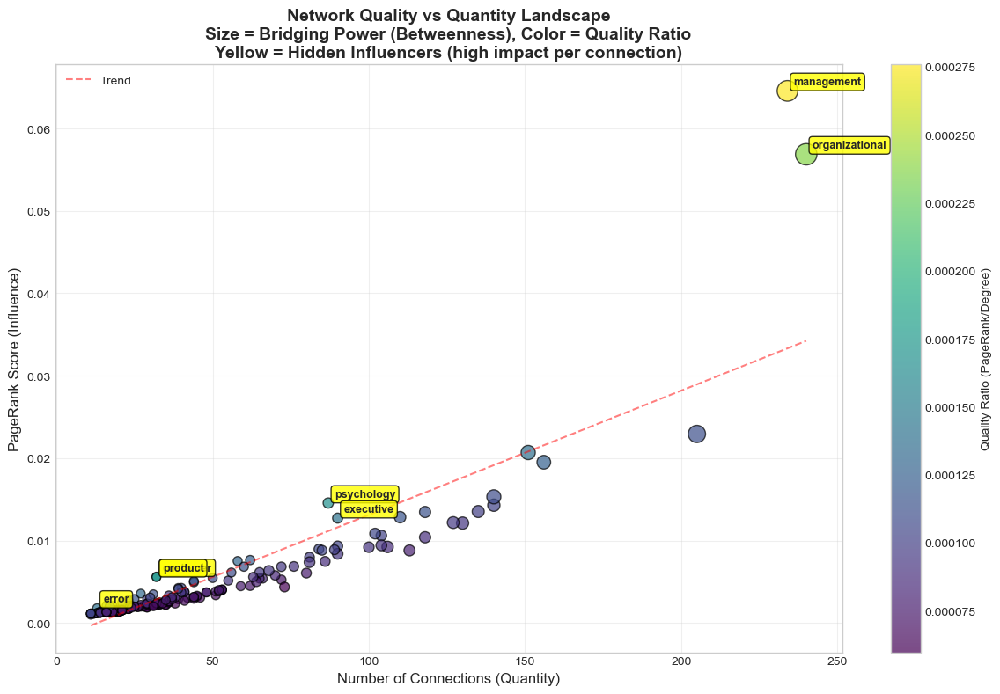


💡 ACTIONABLE INSIGHTS REPORT

1. STRENGTHEN DECISION-MAKING INTEGRATION:

   For 'decision':
   - Strengthen connection to 'agency' (currently: 1)
   - Strengthen connection to 'allocation' (currently: 1)
   - Strengthen connection to 'authorship' (currently: 1)

   For 'making':
   - Strengthen connection to 'agency' (currently: 1)
   - Strengthen connection to 'allocation' (currently: 1)
   - Strengthen connection to 'authorship' (currently: 1)

2. BRIDGE THESE CRITICAL GAPS:

   Connect: 'social' <-> 'executive'
   Rationale: They share 45 connections including:
     - environment
     - labor
     - creative

   Connect: 'psychology' <-> 'corporations'
   Rationale: They share 27 connections including:
     - sociology
     - labor
     - relations

   Connect: 'psychology' <-> 'corporate'
   Rationale: They share 31 connections including:
     - sociology
     - labor
     - relations

3. LEVERAGE THESE HIDDEN INFLUENCERS:

   'management':
   - Has 0.00x more influence than expe

In [4]:
"""
Complete Network Insights Analyzer - All in One File
====================================================
This combines your NetworkAnalyzer with the new insights analysis.
Just run this file directly!
"""

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import warnings
from collections import defaultdict

# Configuration
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")


class NetworkAnalyzer:
    """Your existing NetworkAnalyzer class."""
    
    def __init__(self, data_path=None):
        self.data_path = data_path
        self.co_occurrence_matrix = None
        self.network = None
        
    def find_data_file(self):
        if self.data_path and os.path.exists(self.data_path):
            return self.data_path
            
        common_paths = [
            "co_occurrence_matrix.csv",
            os.path.expanduser("~/Downloads/co_occurrence_matrix.csv"),
            os.path.expanduser("~/Desktop/co_occurrence_matrix.csv")
        ]
        
        for path in common_paths:
            if os.path.exists(path):
                print(f"✅ Found data file: {path}")
                return path
                
        print("⚠️ No data file found in common locations")
        return None
    
    def load_data(self):
        file_path = self.find_data_file()
        
        if not file_path:
            print("❌ Cannot proceed without data file")
            return False
            
        try:
            self.co_occurrence_matrix = pd.read_csv(file_path, index_col=0)
            print(f"📊 Loaded dataset: {self.co_occurrence_matrix.shape}")
            
            # Clean keyword names
            self.co_occurrence_matrix.columns = self.co_occurrence_matrix.columns.map(self._clean_keyword)
            self.co_occurrence_matrix.index = self.co_occurrence_matrix.index.map(self._clean_keyword)
            
            # Remove empty keywords
            self.co_occurrence_matrix = self.co_occurrence_matrix.loc[
                self.co_occurrence_matrix.index != '', 
                self.co_occurrence_matrix.columns != ''
            ]
            
            print(f"🧹 Cleaned data: {self.co_occurrence_matrix.shape}")
            return True
            
        except Exception as e:
            print(f"❌ Error loading data: {e}")
            return False
    
    def _clean_keyword(self, keyword):
        if pd.isna(keyword):
            return ""
        cleaned = " ".join(str(keyword).replace("--", " ").split())
        return cleaned.strip().lower()
    
    def build_network(self, min_weight=1):
        if self.co_occurrence_matrix is None:
            print("❌ No data loaded. Call load_data() first.")
            return False
            
        print(f"🔨 Building network (min_weight={min_weight})...")
        
        self.network = nx.Graph()
        
        # Add edges based on co-occurrence weights
        for word1 in self.co_occurrence_matrix.index:
            for word2 in self.co_occurrence_matrix.columns:
                if word1 != word2:
                    weight = self.co_occurrence_matrix.at[word1, word2]
                    if pd.notna(weight) and weight >= min_weight:
                        self.network.add_edge(word1, word2, weight=weight)
        
        # Remove isolated nodes
        isolated_nodes = list(nx.isolates(self.network))
        self.network.remove_nodes_from(isolated_nodes)
        
        print(f"✅ Network built: {self.network.number_of_nodes()} nodes, {self.network.number_of_edges()} edges")
        return True


# Now add the insights analysis functions
def analyze_decision_concepts(network):
    """Deep analysis of decision-making concepts."""
    print("\n🎯 DECISION-MAKING CONCEPTS ANALYSIS")
    print("=" * 50)
    
    # Find decision-related nodes
    decision_nodes = [n for n in network.nodes() 
                     if any(word in n.lower() for word in 
                           ['decision', 'making', 'choice', 'judgment', 'select'])]
    
    if not decision_nodes:
        print("No decision-related concepts found!")
        return
    
    print(f"\nFound {len(decision_nodes)} decision-related concepts:")
    for node in decision_nodes:
        print(f"  - {node}")
    
    # Get their metrics
    pagerank = nx.pagerank(network, weight='weight')
    degree_cent = nx.degree_centrality(network)
    
    print("\n📊 Decision Concept Metrics:")
    print(f"{'Concept':<20} {'PageRank':<10} {'Degree':<10} {'Connections':<12}")
    print("-" * 52)
    
    for node in decision_nodes:
        connections = network.degree(node)
        print(f"{node:<20} {pagerank.get(node, 0):<10.4f} "
              f"{degree_cent.get(node, 0):<10.4f} {connections:<12}")
    
    # Analyze connections
    print("\n🔗 Top Connections to Decision Concepts:")
    for node in decision_nodes:
        neighbors = list(network.neighbors(node))
        if neighbors:
            # Get top 5 by weight
            weighted_neighbors = [(n, network[node][n]['weight']) for n in neighbors]
            weighted_neighbors.sort(key=lambda x: x[1], reverse=True)
            
            print(f"\n{node} strongly connects to:")
            for neighbor, weight in weighted_neighbors[:5]:
                print(f"  - {neighbor} (weight: {weight})")
    
    # Check if 'decision' and 'making' are connected
    if 'decision' in network and 'making' in network:
        if network.has_edge('decision', 'making'):
            weight = network['decision']['making']['weight']
            print(f"\n✓ 'decision' <-> 'making' connected (weight: {weight})")
        else:
            print("\n❌ 'decision' and 'making' NOT directly connected!")
            try:
                path = nx.shortest_path(network, 'decision', 'making')
                print(f"   Shortest path: {' -> '.join(path)}")
            except:
                print("   No path exists!")


def find_hidden_influencers(network, top_n=15):
    """Find keywords with high quality (influence relative to connections)."""
    print("\n💎 HIDDEN INFLUENCERS ANALYSIS")
    print("=" * 50)
    
    pagerank = nx.pagerank(network, weight='weight')
    degrees = dict(network.degree())
    betweenness = nx.betweenness_centrality(network)
    
    # Calculate quality ratio and influence score
    results = []
    for node in network.nodes():
        pr = pagerank.get(node, 0)
        deg = degrees.get(node, 0)
        bet = betweenness.get(node, 0)
        
        quality_ratio = pr / deg if deg > 0 else 0
        influence_score = (pr * 0.4) + (bet * 0.3) + (quality_ratio * 0.3)
        
        results.append({
            'keyword': node,
            'pagerank': pr,
            'degree': deg,
            'betweenness': bet,
            'quality_ratio': quality_ratio,
            'influence_score': influence_score
        })
    
    # Sort by quality ratio
    results.sort(key=lambda x: x['quality_ratio'], reverse=True)
    
    print(f"\nTop {top_n} Hidden Influencers (High Quality/Quantity Ratio):")
    print(f"{'Keyword':<25} {'Quality Ratio':<12} {'PageRank':<10} {'Connections'}")
    print("-" * 60)
    
    for r in results[:top_n]:
        print(f"{r['keyword']:<25} {r['quality_ratio']:<12.6f} "
              f"{r['pagerank']:<10.4f} {r['degree']}")
    
    # Compare with pure PageRank ranking
    pr_ranking = sorted(results, key=lambda x: x['pagerank'], reverse=True)
    pr_top_keywords = [r['keyword'] for r in pr_ranking[:top_n]]
    quality_top_keywords = [r['keyword'] for r in results[:top_n]]
    
    only_in_quality = set(quality_top_keywords) - set(pr_top_keywords)
    if only_in_quality:
        print(f"\n🌟 Hidden gems (high quality but not in top {top_n} by PageRank):")
        for kw in only_in_quality:
            print(f"  - {kw}")
    
    return results


def find_network_gaps(network, min_common_neighbors=3):
    """Find gaps and weak points in the network."""
    print("\n🔍 NETWORK GAPS AND WEAK POINTS ANALYSIS")
    print("=" * 50)
    
    # 1. Critical bridges
    print("\n1. CRITICAL BRIDGE CONCEPTS:")
    betweenness = nx.betweenness_centrality(network)
    bridges = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:10]
    
    print("(Concepts whose removal would most disrupt the network)")
    for concept, score in bridges[:5]:
        # Check what happens if we remove it
        temp_network = network.copy()
        temp_network.remove_node(concept)
        components_after = nx.number_connected_components(temp_network)
        
        impact = f"Would create {components_after} components" if components_after > 1 else "High connector"
        print(f"  - {concept}: betweenness = {score:.4f} [{impact}]")
    
    # 2. Missing connections
    print(f"\n2. MISSING CONNECTIONS (share {min_common_neighbors}+ neighbors):")
    
    pagerank = nx.pagerank(network, weight='weight')
    important_nodes = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:30]
    
    missing = []
    for i, (node1, pr1) in enumerate(important_nodes):
        for node2, pr2 in important_nodes[i+1:]:
            if not network.has_edge(node1, node2):
                neighbors1 = set(network.neighbors(node1))
                neighbors2 = set(network.neighbors(node2))
                common = neighbors1.intersection(neighbors2)
                if len(common) >= min_common_neighbors:
                    missing.append((node1, node2, len(common), pr1 + pr2))
    
    missing.sort(key=lambda x: x[3], reverse=True)  # Sort by combined importance
    
    for node1, node2, common_count, importance in missing[:10]:
        print(f"  - {node1} <-> {node2}: {common_count} common neighbors")
    
    # 3. Weak important connections
    print("\n3. WEAK CONNECTIONS BETWEEN IMPORTANT CONCEPTS:")
    
    edges_data = [(u, v, d['weight']) for u, v, d in network.edges(data=True)]
    avg_weight = np.mean([w for _, _, w in edges_data])
    
    weak_important = []
    for node1, pr1 in important_nodes[:20]:
        for node2, pr2 in important_nodes[:20]:
            if node1 < node2 and network.has_edge(node1, node2):
                weight = network[node1][node2]['weight']
                if weight < avg_weight * 0.5:  # Less than 50% of average
                    weak_important.append((node1, node2, weight, pr1 + pr2))
    
    weak_important.sort(key=lambda x: x[3], reverse=True)
    
    print(f"(Average edge weight: {avg_weight:.1f})")
    for node1, node2, weight, _ in weak_important[:5]:
        print(f"  - {node1} <-> {node2}: weight = {weight:.1f} (weak!)")


def visualize_quality_landscape(network):
    """Visualize quality vs quantity for all nodes."""
    pagerank = nx.pagerank(network, weight='weight')
    degrees = dict(network.degree())
    betweenness = nx.betweenness_centrality(network)
    
    # Prepare data
    nodes = list(network.nodes())
    pr_scores = [pagerank[n] for n in nodes]
    deg_scores = [degrees[n] for n in nodes]
    bet_scores = [betweenness[n] for n in nodes]
    quality_ratios = [pr_scores[i]/deg_scores[i] if deg_scores[i] > 0 else 0 
                     for i in range(len(nodes))]
    
    # Create figure
    plt.figure(figsize=(12, 8))
    
    # Scatter plot
    scatter = plt.scatter(deg_scores, pr_scores, 
                         s=[b*2000 + 50 for b in bet_scores],  # Size by betweenness
                         c=quality_ratios, 
                         cmap='viridis', 
                         alpha=0.7, 
                         edgecolors='black', 
                         linewidth=1)
    
    # Add trend line
    z = np.polyfit([d for d in deg_scores if d > 0], 
                   [pr_scores[i] for i, d in enumerate(deg_scores) if d > 0], 1)
    p = np.poly1d(z)
    plt.plot(sorted(deg_scores), p(sorted(deg_scores)), "r--", alpha=0.5, label='Trend')
    
    # Label top quality nodes
    top_quality_indices = sorted(range(len(quality_ratios)), 
                                key=lambda i: quality_ratios[i], 
                                reverse=True)[:10]
    
    for idx in top_quality_indices[:7]:  # Label top 7
        plt.annotate(nodes[idx], 
                    (deg_scores[idx], pr_scores[idx]),
                    xytext=(5, 5), 
                    textcoords='offset points',
                    fontsize=9, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.3', 
                             facecolor='yellow', 
                             alpha=0.8))
    
    plt.xlabel('Number of Connections (Quantity)', fontsize=12)
    plt.ylabel('PageRank Score (Influence)', fontsize=12)
    plt.title('Network Quality vs Quantity Landscape\n' +
             'Size = Bridging Power (Betweenness), Color = Quality Ratio\n' +
             'Yellow = Hidden Influencers (high impact per connection)',
             fontsize=14, fontweight='bold')
    
    cbar = plt.colorbar(scatter, label='Quality Ratio (PageRank/Degree)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


def generate_actionable_report(network):
    """Generate specific actionable insights."""
    print("\n💡 ACTIONABLE INSIGHTS REPORT")
    print("=" * 60)
    
    pagerank = nx.pagerank(network, weight='weight')
    
    # Decision-making insights
    decision_nodes = [n for n in network.nodes() 
                     if 'decision' in n.lower() or 'making' in n.lower()]
    
    if decision_nodes:
        print("\n1. STRENGTHEN DECISION-MAKING INTEGRATION:")
        for node in decision_nodes[:2]:
            neighbors = list(network.neighbors(node))
            non_decision = [n for n in neighbors 
                          if 'decision' not in n.lower() and 'making' not in n.lower()]
            if non_decision:
                weights = [(n, network[node][n]['weight']) for n in non_decision]
                weights.sort(key=lambda x: x[1])
                weakest = weights[:3]
                print(f"\n   For '{node}':")
                for neighbor, weight in weakest:
                    print(f"   - Strengthen connection to '{neighbor}' (currently: {weight})")
    
    # Gap-bridging opportunities
    print("\n2. BRIDGE THESE CRITICAL GAPS:")
    
    # Find important disconnected pairs
    top_20 = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:20]
    gaps = []
    
    for i, (n1, pr1) in enumerate(top_20):
        for n2, pr2 in top_20[i+1:]:
            if not network.has_edge(n1, n2):
                common = set(network.neighbors(n1)).intersection(set(network.neighbors(n2)))
                if len(common) >= 2:
                    gaps.append((n1, n2, len(common), pr1 * pr2))
    
    gaps.sort(key=lambda x: x[3], reverse=True)
    
    for n1, n2, common, _ in gaps[:3]:
        print(f"\n   Connect: '{n1}' <-> '{n2}'")
        print(f"   Rationale: They share {common} connections including:")
        common_list = list(set(network.neighbors(n1)).intersection(set(network.neighbors(n2))))[:3]
        for c in common_list:
            print(f"     - {c}")
    
    # Quality leverage
    print("\n3. LEVERAGE THESE HIDDEN INFLUENCERS:")
    
    degrees = dict(network.degree())
    quality_scores = {n: pagerank[n]/degrees[n] if degrees[n] > 0 else 0 
                     for n in network.nodes()}
    top_quality = sorted(quality_scores.items(), key=lambda x: x[1], reverse=True)[:5]
    
    for keyword, score in top_quality:
        print(f"\n   '{keyword}':")
        print(f"   - Has {score:.2f}x more influence than expected from connections alone")
        print(f"   - Currently connects to {degrees[keyword]} concepts")
        print(f"   - Action: Feature more prominently in content/research")


# Main execution function
def run_complete_analysis():
    """Run the complete network analysis with insights."""
    print("🚀 COMPLETE NETWORK ANALYSIS WITH DEEP INSIGHTS")
    print("=" * 60)
    
    # Initialize and load data
    analyzer = NetworkAnalyzer()
    
    if not analyzer.load_data():
        return None
    
    if not analyzer.build_network():
        return None
    
    # Basic stats
    print(f"\n📊 NETWORK OVERVIEW:")
    print(f"  Nodes: {analyzer.network.number_of_nodes()}")
    print(f"  Edges: {analyzer.network.number_of_edges()}")
    print(f"  Density: {nx.density(analyzer.network):.4f}")
    
    # Run insights analyses
    analyze_decision_concepts(analyzer.network)
    results = find_hidden_influencers(analyzer.network)
    find_network_gaps(analyzer.network)
    visualize_quality_landscape(analyzer.network)
    generate_actionable_report(analyzer.network)
    
    print("\n✅ Analysis complete!")
    
    return analyzer, results


# Run it!
if __name__ == "__main__":
    analyzer, results = run_complete_analysis()
    
    if analyzer and results:
        # Optional: Save results
        results_df = pd.DataFrame(results[:30])  # Top 30
        results_df.to_csv('network_insights_results.csv', index=False)
        print("\n📁 Results saved to 'network_insights_results.csv'")